<a href="https://colab.research.google.com/github/Aasees28/Week1---Intro-to-Python/blob/main/Image_Classification_YOLO11_IAT360.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
!scp '/content/drive/My Drive/IAT 360 - Computer Vision - Classification/Plant Diseases.zip' '/content/data.zip'

!unzip '/content/data.zip' -d '/content/'

Streaming output truncated to the last 5000 lines.
 extracting: /content/train/Tomato__Target_Spot/356ce2f5-2a94-4d0c-8b3b-7968e62d5393___Com-G_TgS_FL-8230_JPG.rf.0020963ef5634d28325c6a4edbb684bc.jpg  
 extracting: /content/train/Tomato__Target_Spot/356ce2f5-2a94-4d0c-8b3b-7968e62d5393___Com-G_TgS_FL-8230_JPG.rf.3d1155f56650cf2a4eb39dcc0cd31d90.jpg  
 extracting: /content/train/Tomato__Target_Spot/356ce2f5-2a94-4d0c-8b3b-7968e62d5393___Com-G_TgS_FL-8230_JPG.rf.d619f054876e066c8298092a381f7233.jpg  
 extracting: /content/train/Tomato__Target_Spot/35b0ec56-80f9-4fee-bbf4-b80f782ad37b___Com-G_TgS_FL-9985_JPG.rf.161b380f0069153fff93fd2e56e4528a.jpg  
 extracting: /content/train/Tomato__Target_Spot/36c496c8-403b-4f76-abea-0834dcda8d0c___Com-G_TgS_FL-8222_JPG.rf.60ea81433e0fa187f15f1cd9d81b931d.jpg  
 extracting: /content/train/Tomato__Target_Spot/36c496c8-403b-4f76-abea-0834dcda8d0c___Com-G_TgS_FL-8222_JPG.rf.d350e5f167372f42cec885faacab7d4e.jpg  
 extracting: /content/train/Tomato__Target_

# **Image Classification** using YOLO11

In [ ]:
# Install the necessary libraries
!pip install ultralytics roboflow opencv-python pandas


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 881.4/881.4 kB 16.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.3/80.3 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 3.2 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10


In [9]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 879.0/879.0 kB 22.9 MB/s eta 0:00:00


In [10]:
# Train the YOLO11 model
from ultralytics import YOLO

# Path to the data.yaml file
data_path = '/content/data'

# Initialize the YOLO11 model - using the nano model for speed
model = YOLO('yolo11n-cls.pt')  # Load a pretrained YOLO11 model

# Train the model
model.train(task='classify', mode='train', data=data_path, epochs=10) # task and mode are optional parameters

# !yolo task=classify mode=train model=yolo11n-cls.pt data=data_path epochs=10


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 5.52M/5.52M [00:00<00:00, 88.7MB/s]


Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=classify, mode=train, model=yolo11n-cls.pt, data=/content/data, epochs=10, time=None, patience=100, batch=16, imgsz=224, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, 

Unzipping /content/data.zip to /content/data...: 100%|██████████| 17900/17900 [00:09<00:00, 1977.49file/s]

Dataset download success ✅ (9.3s), saved to /content/data



train: /content/data/train... found 16118 images in 15 classes ✅ 
val: None...
test: /content/data/test... found 1748 images in 15 classes ✅ 
Overriding model.yaml nc=80 with nc=15

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                 

100%|██████████| 5.35M/5.35M [00:00<00:00, 108MB/s]


AMP: checks passed ✅


train: Scanning /content/data/train... 16118 images, 0 corrupt: 100%|██████████| 16118/16118 [00:04<00:00, 3800.92it/s]


train: New cache created: /content/data/train.cache


val: Scanning /content/data/test... 1748 images, 0 corrupt: 100%|██████████| 1748/1748 [00:00<00:00, 2071.47it/s]


val: New cache created: /content/data/test.cache
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 39 weight(decay=0.0), 40 weight(decay=0.0005), 40 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 224 train, 224 val
Using 2 dataloader workers
Logging results to runs/classify/train
Starting training for 10 epochs...

      Epoch    GPU_mem       loss  Instances       Size


       1/10     0.296G      2.906         16        224:   1%|          | 6/1008 [00:01<03:11,  5.24it/s]

       1/10     0.296G       2.89         16        224:   1%|          | 11/1008 [00:02<02:29,  6.67it/s]
100%|██████████| 755k/755k [00:00<00:00, 19.9MB/s]
               classes   top1_acc   top5_acc: 100%|██████████| 55/55 [00:13<00:00,  4.05it/s]

                   all      0.949      0.998



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 55/55 [00:14<00:00,  3.87it/s]

                   all      0.953      0.999



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 55/55 [00:13<00:00,  4.21it/s]

                   all      0.961      0.999



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 55/55 [00:13<00:00,  4.07it/s]

                   all      0.973      0.999



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 55/55 [00:12<00:00,  4.47it/s]

                   all       0.98      0.999



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 55/55 [00:13<00:00,  4.02it/s]

                   all      0.979      0.999



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 55/55 [00:11<00:00,  4.62it/s]

                   all       0.99      0.999



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 55/55 [00:11<00:00,  4.70it/s]

                   all      0.989      0.999



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 55/55 [00:10<00:00,  5.22it/s]

                   all      0.994      0.999



      Epoch    GPU_mem       loss  Instances       Size


      10/10     0.268G    0.04795          6        224: 100%|██████████| 1008/1008 [03:02<00:00,  5.51it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 55/55 [00:12<00:00,  4.40it/s]

                   all      0.993      0.999



10 epochs completed in 0.555 hours.
Optimizer stripped from runs/classify/train/weights/last.pt, 3.2MB
Optimizer stripped from runs/classify/train/weights/best.pt, 3.2MB

Validating runs/classify/train/weights/best.pt...
Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n-cls summary (fused): 112 layers, 1,545,239 parameters, 0 gradients, 3.2 GFLOPs
WARNING ⚠️ Dataset 'split=val' not found, using 'split=test' instead.
train: /content/data/train... found 16118 images in 15 classes ✅ 
val: None...
test: /content/data/test... found 1748 images in 15 classes ✅ 


               classes   top1_acc   top5_acc: 100%|██████████| 55/55 [00:12<00:00,  4.24it/s]


                   all      0.994      0.999
Speed: 0.1ms preprocess, 0.6ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to runs/classify/train


ultralytics.utils.metrics.ClassifyMetrics object with attributes:

confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x790f34e571c0>
curves: []
curves_results: []
fitness: 0.9968535602092743
keys: ['metrics/accuracy_top1', 'metrics/accuracy_top5']
results_dict: {'metrics/accuracy_top1': 0.9942792057991028, 'metrics/accuracy_top5': 0.9994279146194458, 'fitness': 0.9968535602092743}
save_dir: PosixPath('runs/classify/train')
speed: {'preprocess': 0.07817251458593583, 'inference': 0.5523897963203064, 'loss': 0.003334450230718477, 'postprocess': 0.00043182678571827626}
task: 'classify'
top1: 0.9942792057991028
top5: 0.9994279146194458

In [ ]:
# Export the model
# model.export(format='onnx')  # You can choose 'tflite', 'torchscript', etc.


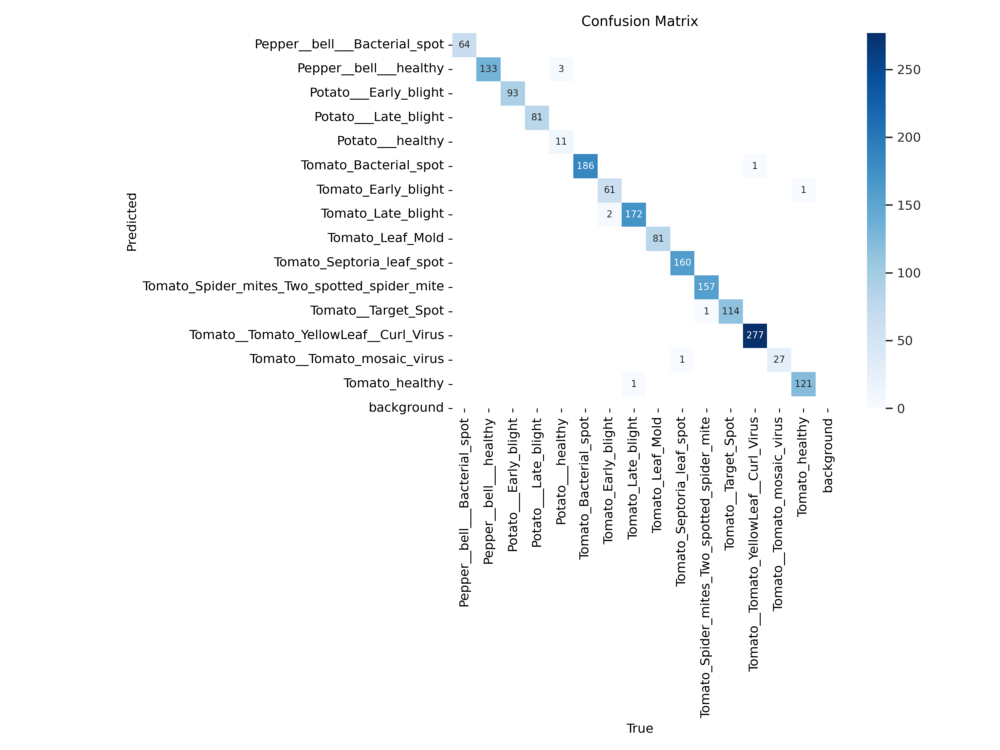

In [11]:
# Show Confusion Matrix
from IPython.display import Image, display
display(Image('/content/runs/classify/train/confusion_matrix.png'))


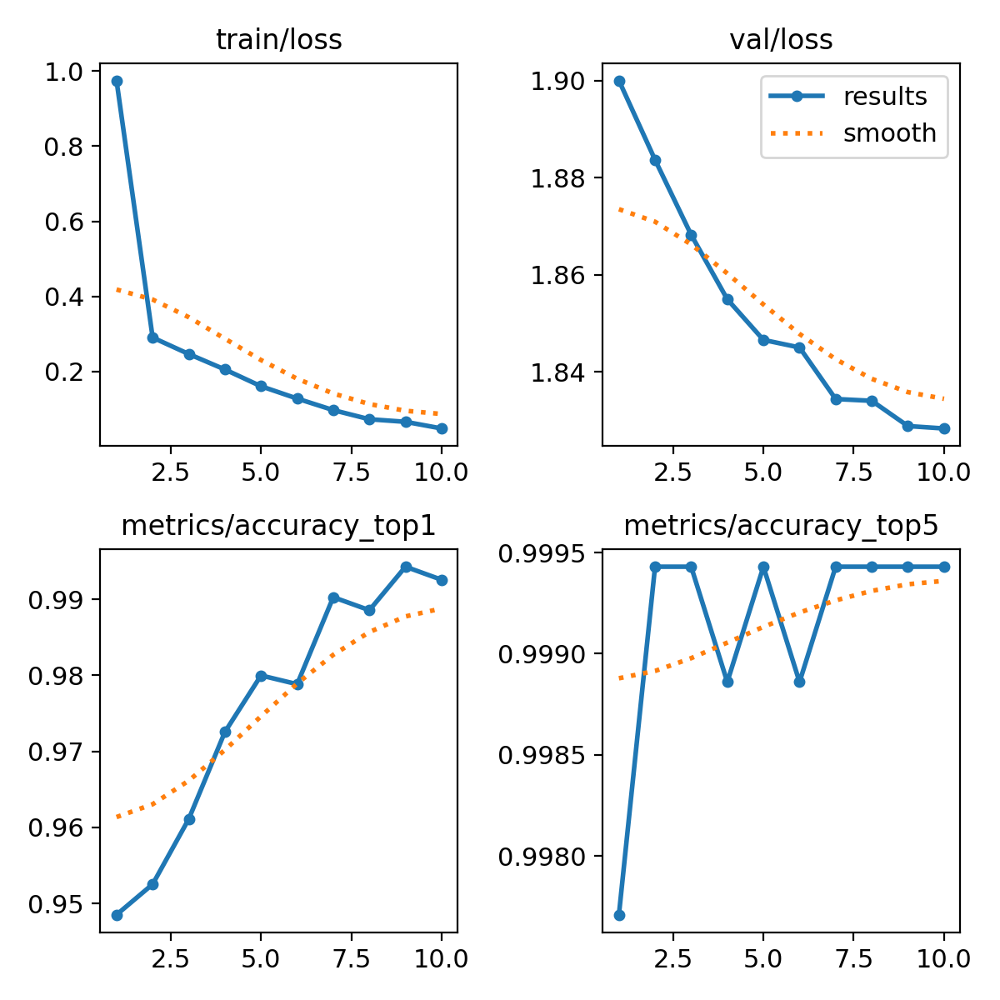

In [12]:
# Show Results (image)
display(Image('/content/runs/classify/train/results.png'))


In [13]:
# Show Results (table)
import pandas as pd

# Load the CSV file into a pandas DataFrame
csv_file_path = '/content/runs/classify/train/results.csv'
df = pd.read_csv(csv_file_path)

# Display the DataFrame
print(df)


   epoch      time  train/loss  metrics/accuracy_top1  metrics/accuracy_top5  \
0      1   209.213     0.97526                0.94851                0.99771   
1      2   410.276     0.29026                0.95252                0.99943   
2      3   613.120     0.24632                0.96110                0.99943   
3      4   812.723     0.20515                0.97254                0.99886   
4      5  1009.090     0.16047                0.97998                0.99943   
5      6  1210.620     0.12766                0.97883                0.99886   
6      7  1405.280     0.09689                0.99027                0.99943   
7      8  1603.530     0.07252                0.98856                0.99943   
8      9  1801.880     0.06571                0.99428                0.99943   
9     10  1998.660     0.04795                0.99256                0.99943   

   val/loss    lr/pg0    lr/pg1    lr/pg2  
0   1.90005  0.000238  0.000238  0.000238  
1   1.88370  0.000429  0.000429

In [15]:
# Package imports and train path
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

train_path = '/content/runs/classify/train'


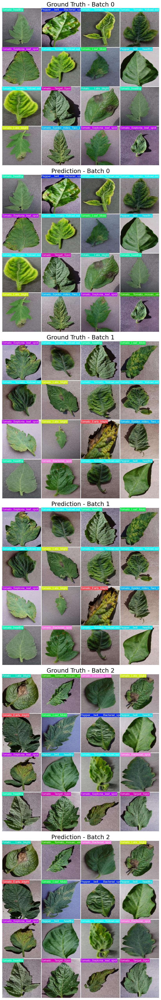

In [22]:
# Validation Results: Ground Truth vs Prediction

# Load your images using matplotlib's imread
img1 = mpimg.imread(f'{train_path}/val_batch0_labels.jpg')
img2 = mpimg.imread(f'{train_path}/val_batch0_pred.jpg')
img3 = mpimg.imread(f'{train_path}/val_batch1_labels.jpg')
img4 = mpimg.imread(f'{train_path}/val_batch1_pred.jpg')
img5 = mpimg.imread(f'{train_path}/val_batch2_labels.jpg')
img6 = mpimg.imread(f'{train_path}/val_batch2_pred.jpg')

# Get image dimensions (assuming all images are of the same size)
img_height, img_width, _ = img1.shape

# Create a figure with subplots, adjusting the figure size to match the image size
fig, axes = plt.subplots(6, 1, figsize=(img_width / 100, 6 * img_height / 100))  # 6 rows, 1 column

# Add a title to the figure with a bigger font size
# fig.suptitle('Validation Results: Ground Truth vs Prediction', fontsize=24)

# Plot the images and add larger titles for each subplot
axes[0].imshow(img1)
axes[0].set_title("Ground Truth - Batch 0", fontsize=22)  # Larger subplot title
axes[1].imshow(img2)
axes[1].set_title("Prediction - Batch 0", fontsize=22)

axes[2].imshow(img3)
axes[2].set_title("Ground Truth - Batch 1", fontsize=22)
axes[3].imshow(img4)
axes[3].set_title("Prediction - Batch 1", fontsize=22)

axes[4].imshow(img5)
axes[4].set_title("Ground Truth - Batch 2", fontsize=22)
axes[5].imshow(img6)
axes[5].set_title("Prediction - Batch 2", fontsize=22)

# Turn off axes for all subplots
for ax in axes:
    ax.axis('off')

# Adjust layout to prevent overlap and show the title
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Display the plot
plt.show()


In [24]:
# Predict on test data using trained model
import os

# Load the trained classification model
model = YOLO('/content/runs/classify/train/weights/best.pt')

# Specify the test folder path (which contains class subfolders)
test_folder = '/content/data/test'

# Loop through each class folder in the test directory
for class_folder in os.listdir(test_folder):
    class_folder_path = os.path.join(test_folder, class_folder)

    # Make sure it's a directory (to avoid any non-folder files)
    if os.path.isdir(class_folder_path):
        ground_truth_class = class_folder  # This is the ground truth class based on the folder name
        print(f"Processing class folder (Ground Truth): {ground_truth_class}")

        # List all images in the current class folder
        image_files = [os.path.join(class_folder_path, img) for img in os.listdir(class_folder_path) if img.endswith(('.jpg', '.jpeg', '.png'))]

        # Predict on each image in the class folder
        for img_path in image_files:
            # Perform classification on the image
            results = model.predict(img_path, conf=0.50)

            # Loop through the results and extract predictions
            for result in results:
                # Get the predicted class index (top-1) and confidence
                predicted_class_index = result.probs.top1              # Get the predicted class index (top-1)
                predicted_class = result.names[predicted_class_index]  # Map index to class name
                confidence = result.probs.top1conf                     # Get the confidence score for the top prediction

                # Display the prediction results for the image along with ground truth
                print(f"Image: {img_path}")
                print(f"Ground Truth: {ground_truth_class}, Predicted class: {predicted_class}, Confidence: {confidence:.2f}")


Streaming output truncated to the last 5000 lines.
Image: /content/data/test/Tomato_Late_blight/7fc8f2f2-874c-49d1-935b-06f2d044db8f___RS_Late-B-6451_JPG.rf.953241c9adea38d75b1ec262b8a6e913.jpg
Ground Truth: Tomato_Late_blight, Predicted class: Tomato_Late_blight, Confidence: 1.00

image 1/1 /content/data/test/Tomato_Late_blight/8faf866d-77a2-4876-983f-42389db476dc___RS_Late-B-7003_JPG.rf.c3ac074bbe9636c3b841924f23799f72.jpg: 224x224 Tomato_Late_blight 1.00, Potato___Late_blight 0.00, Tomato_Early_blight 0.00, Potato___Early_blight 0.00, Tomato__Target_Spot 0.00, 9.3ms
Speed: 11.3ms preprocess, 9.3ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
Image: /content/data/test/Tomato_Late_blight/8faf866d-77a2-4876-983f-42389db476dc___RS_Late-B-7003_JPG.rf.c3ac074bbe9636c3b841924f23799f72.jpg
Ground Truth: Tomato_Late_blight, Predicted class: Tomato_Late_blight, Confidence: 1.00

image 1/1 /content/data/test/Tomato_Late_blight/e28f932e-5ee0-4306-ac45-514c9c3c9476___GHLB2-Le